# T-SNE

## Teoria

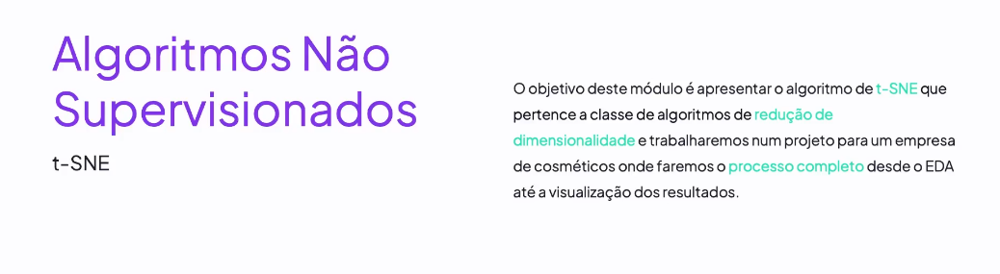

### O que é?

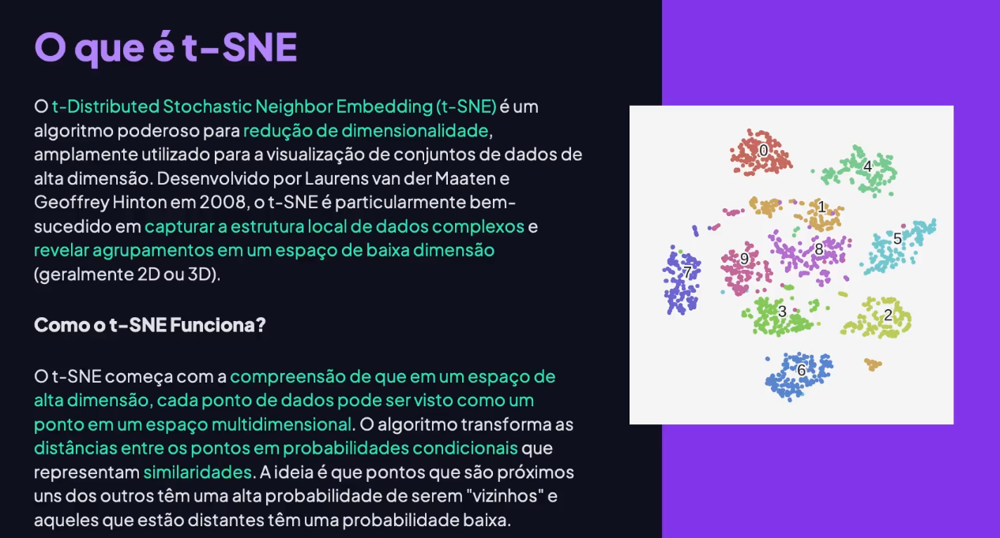

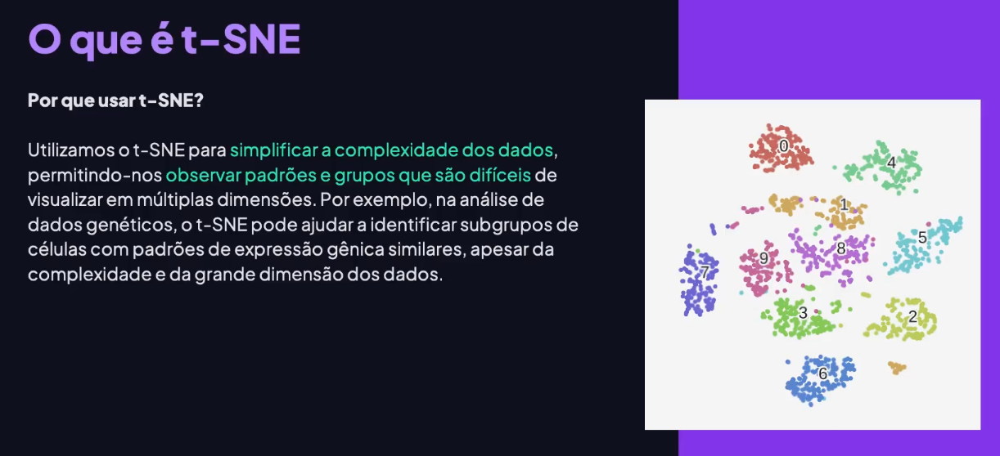

### Etapas

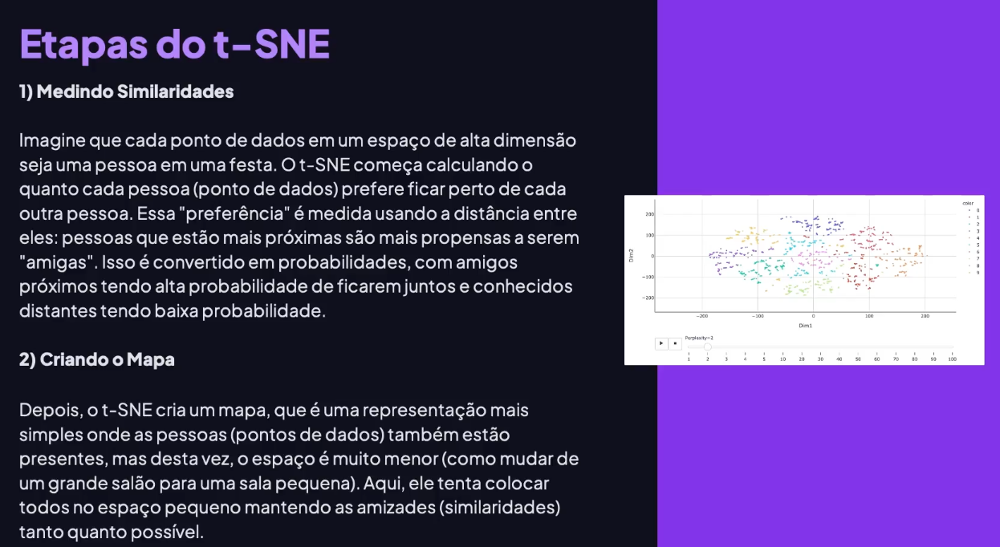

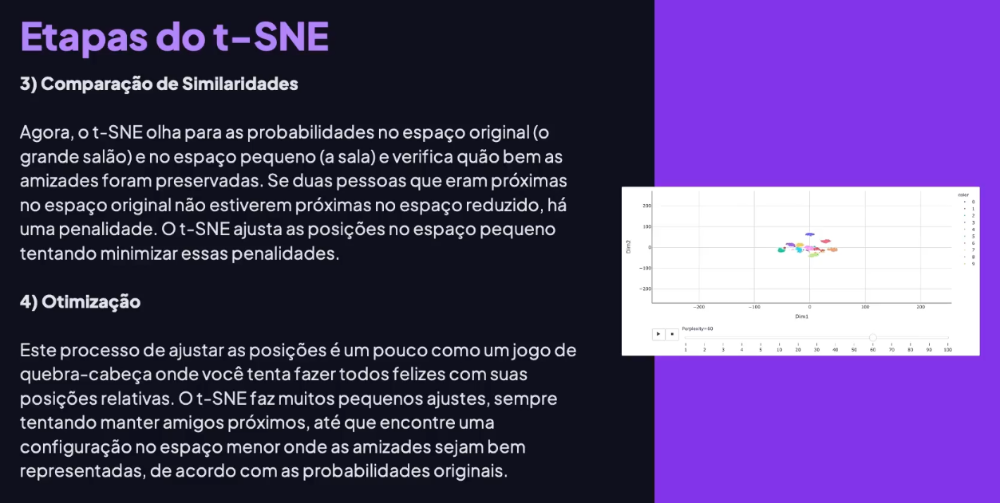

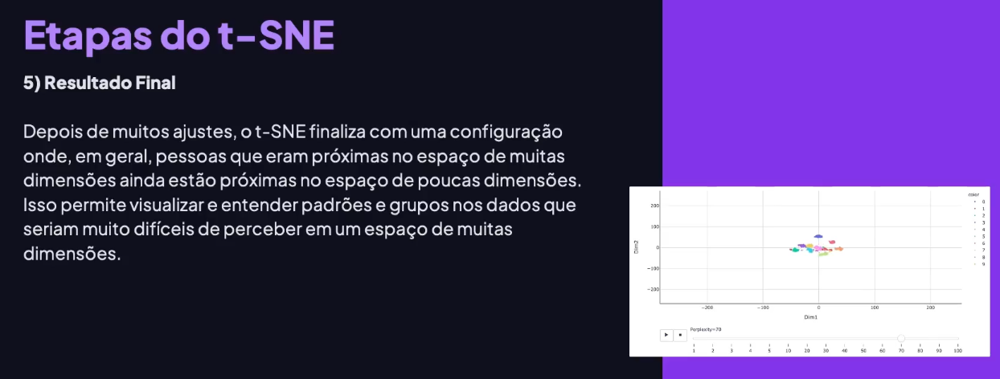

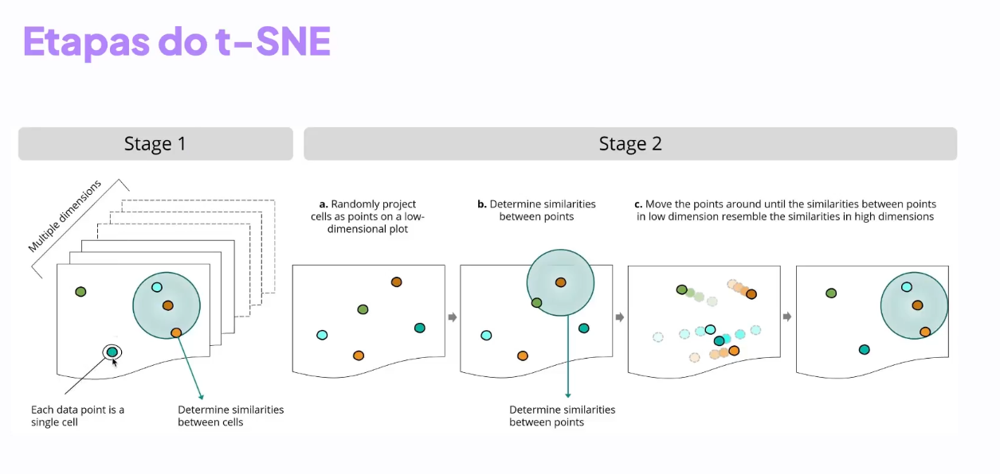

### Mecânica do T-SNE

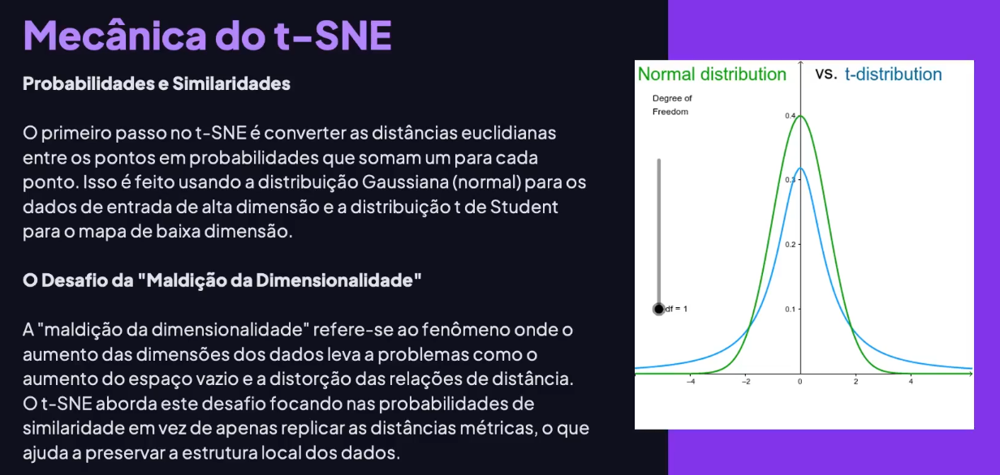

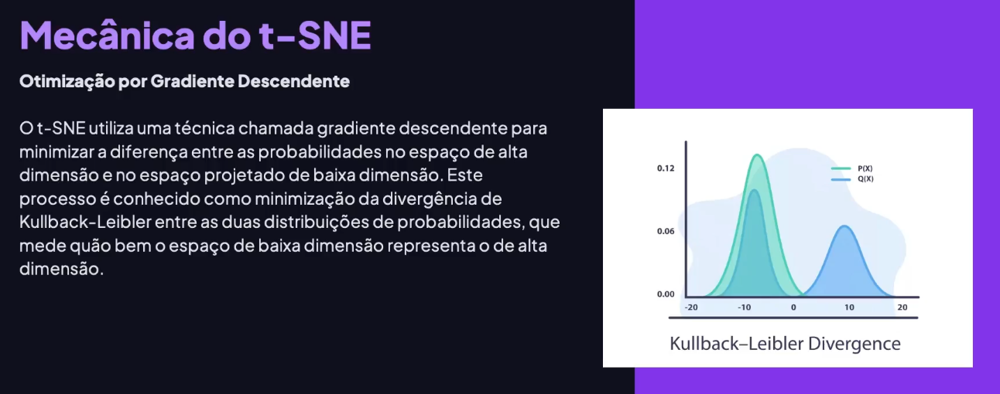

### Desafios e Limitações

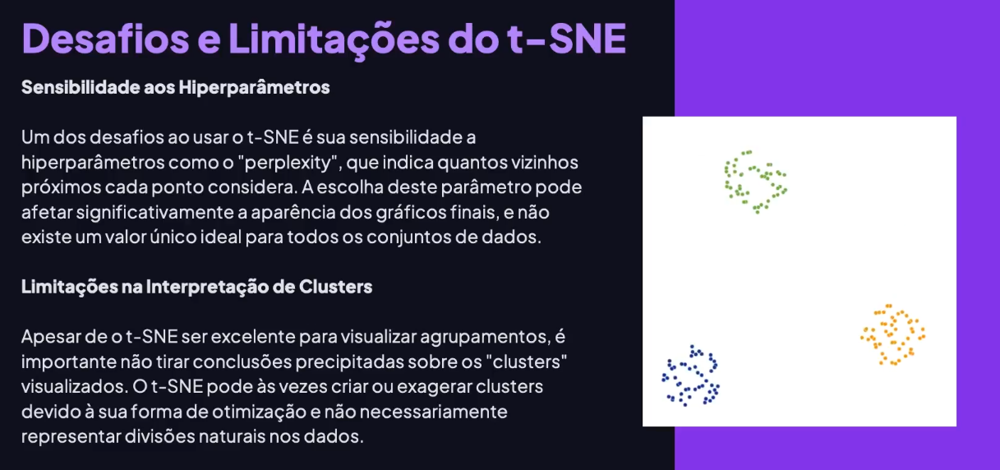

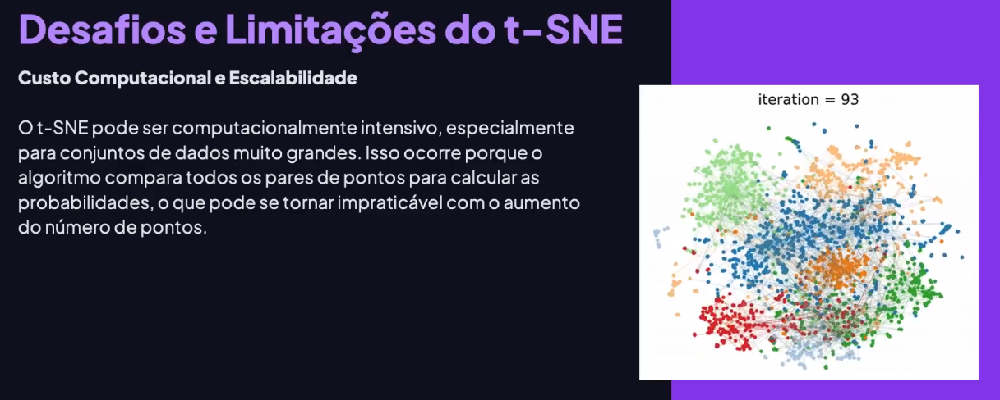

### Aplicações

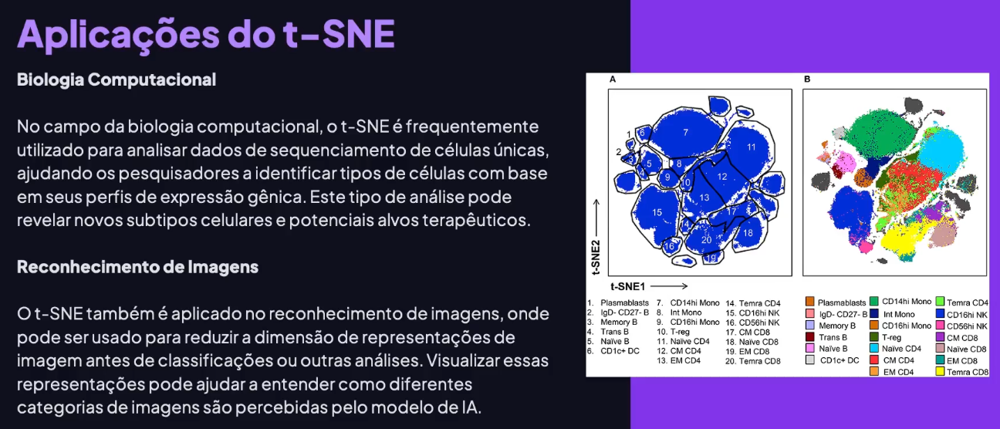

### T-SNE vs PCA

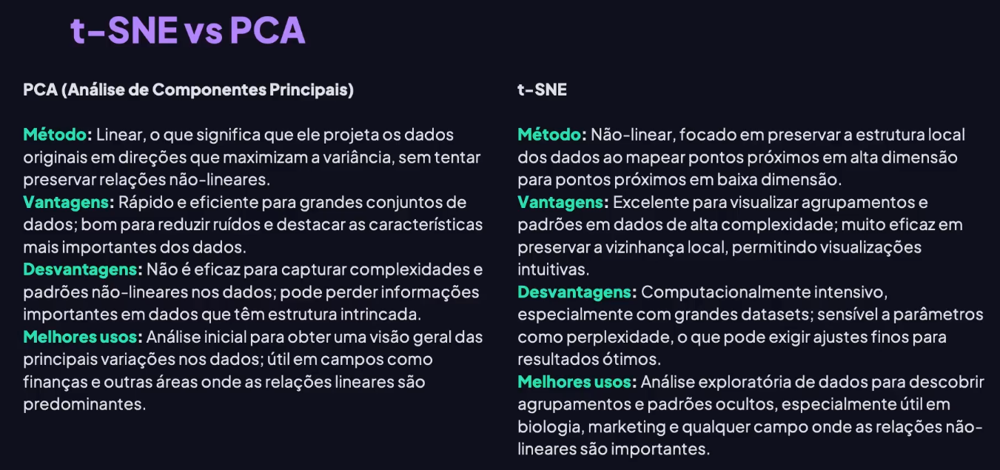

### Hiperparâmetro Perplexity

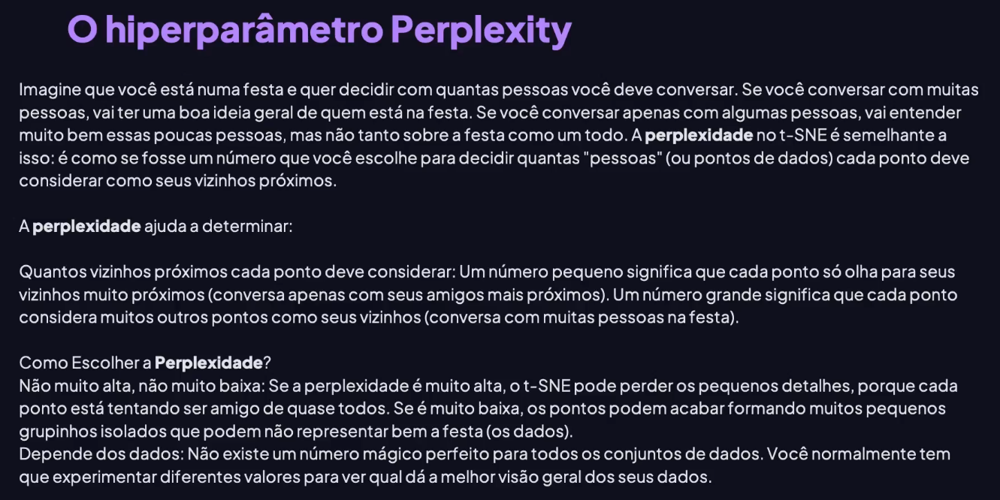

## Projeto

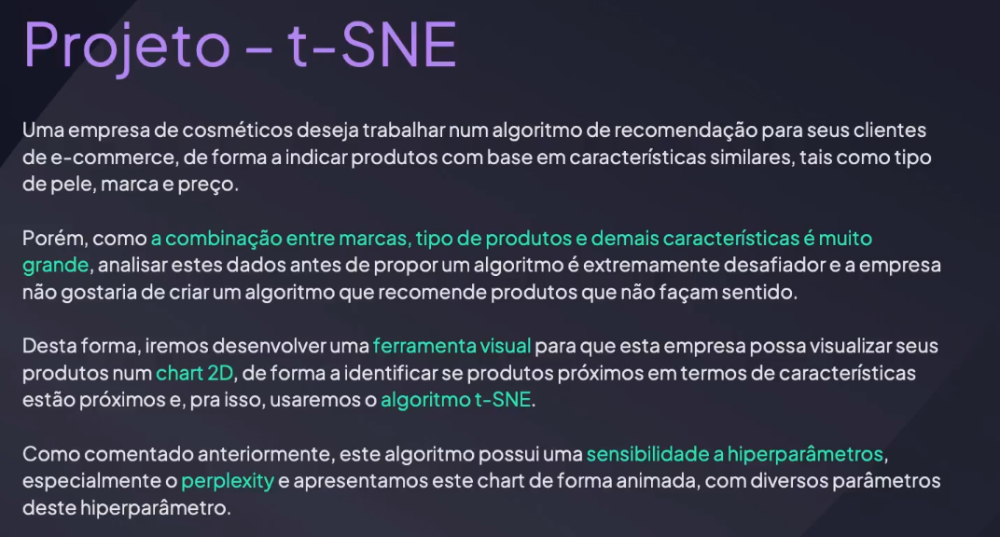

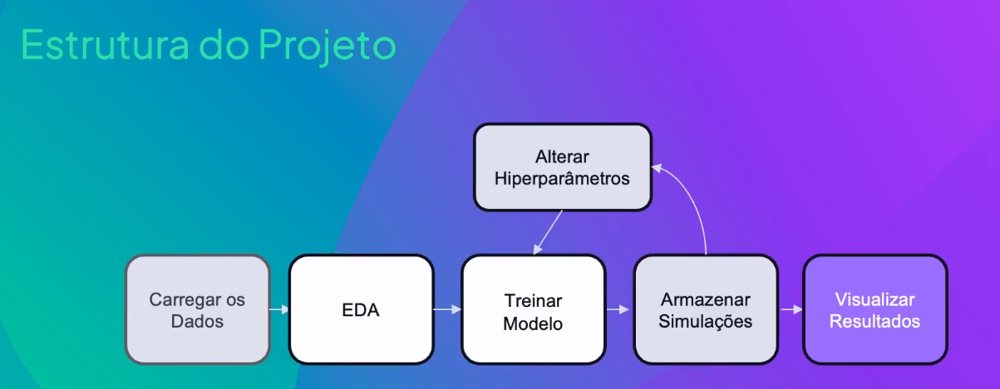

## Importações

`pipenv install pandas plotly matplotlib scikit-learn ipykernel ipywidgets nbformat seaborn -d --python 3.9`

In [1]:
# EDA
import pandas as pd
import plotly.express as px
import seaborn as sns

# ML
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.manifold import TSNE

## Carga dos dados

In [2]:
# Carregar o dataset
df_cosmeticos = pd.read_csv('./dataset/cosmeticos.csv')

In [3]:
# Visualizar estrutura do dataframe
df_cosmeticos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1472 entries, 0 to 1471
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Tipo           1472 non-null   object 
 1   Marca          1472 non-null   object 
 2   Nome           1472 non-null   object 
 3   Preco          1472 non-null   int64  
 4   Rating         1472 non-null   float64
 5   Ingredientes   1472 non-null   object 
 6   Pele_Mista     1472 non-null   int64  
 7   Pele_Seca      1472 non-null   int64  
 8   Pele_Normal    1472 non-null   int64  
 9   Pele_Oleosa    1472 non-null   int64  
 10  Pele_Sensivel  1472 non-null   int64  
dtypes: float64(1), int64(6), object(4)
memory usage: 126.6+ KB


In [4]:
# Visualizar os 5 primeiros registros
df_cosmeticos.head(5)

,Tipo,Marca,Nome,Preco,Rating,Ingredientes,Pele_Mista,Pele_Seca,Pele_Normal,Pele_Oleosa,Pele_Sensivel
0,Moisturizer,LA MER,Crème de la Mer,175,4.1,"Algae (Seaweed) Extract, Mineral Oil, Petrolat...",1,1,1,1,1
1,Moisturizer,SK-II,Facial Treatment Essence,179,4.1,"Galactomyces Ferment Filtrate (Pitera), Butyle...",1,1,1,1,1
2,Moisturizer,DRUNK ELEPHANT,Protini™ Polypeptide Cream,68,4.4,"Water, Dicaprylyl Carbonate, Glycerin, Ceteary...",1,1,1,1,0
3,Moisturizer,LA MER,The Moisturizing Soft Cream,175,3.8,"Algae (Seaweed) Extract, Cyclopentasiloxane, P...",1,1,1,1,1
4,Moisturizer,IT COSMETICS,Your Skin But Better™ CC+™ Cream with SPF 50+,38,4.1,"Water, Snail Secretion Filtrate, Phenyl Trimet...",1,1,1,1,1


In [5]:
# Visualizar os 5 últimos registros
df_cosmeticos.tail(5)

,Tipo,Marca,Nome,Preco,Rating,Ingredientes,Pele_Mista,Pele_Seca,Pele_Normal,Pele_Oleosa,Pele_Sensivel
1467,Sun protect,KORRES,Yoghurt Nourishing Fluid Veil Face Sunscreen B...,35,3.9,"Water, Alcohol Denat., Potassium Cetyl Phospha...",1,1,1,1,1
1468,Sun protect,KATE SOMERVILLE,Daily Deflector™ Waterlight Broad Spectrum SPF...,48,3.6,"Water, Isododecane, Dimethicone, Butyloctyl Sa...",0,0,0,0,0
1469,Sun protect,VITA LIBERATA,Self Tan Dry Oil SPF 50,54,3.5,"Water, Dihydroxyacetone, Glycerin, Sclerocarya...",0,0,0,0,0
1470,Sun protect,ST. TROPEZ TANNING ESSENTIALS,Pro Light Self Tan Bronzing Mist,20,1.0,"Water, Dihydroxyacetone, Propylene Glycol, PPG...",0,0,0,0,0
1471,Sun protect,DERMAFLASH,DERMAPROTECT Daily Defense Broad Spectrum SPF 50+,45,0.0,Visit the DERMAFLASH boutique,1,1,1,1,1


## EDA

### Análise univariada

In [6]:
# Visualizar estatísticas descritivas
df_cosmeticos.describe()

,Preco,Rating,Pele_Mista,Pele_Seca,Pele_Normal,Pele_Oleosa,Pele_Sensivel
count,1472.000000,1472.000000,1472.00000,1472.000000,1472.000000,1472.000000,1472.000000
mean,55.584239,4.153261,0.65625,0.614130,0.652174,0.607337,0.513587
std,45.014429,0.633918,0.47512,0.486965,0.476442,0.488509,0.499985
min,3.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,4.000000,0.00000,0.000000,0.000000,0.000000,0.000000
50%,42.500000,4.300000,1.00000,1.000000,1.000000,1.000000,1.000000
75%,68.000000,4.500000,1.00000,1.000000,1.000000,1.000000,1.000000
max,370.000000,5.000000,1.00000,1.000000,1.000000,1.000000,1.000000


In [23]:
# Transformar os valores da coluna 'Ingredientes' em um novo dataframe
df_cosmeticos_eda = df_cosmeticos.copy()
df_cosmeticos_eda = df_cosmeticos_eda['Ingredientes'].str.split(',')

In [24]:
df_cosmeticos_eda

0       [Algae (Seaweed) Extract,  Mineral Oil,  Petro...
1       [Galactomyces Ferment Filtrate (Pitera),  Buty...
2       [Water,  Dicaprylyl Carbonate,  Glycerin,  Cet...
3       [Algae (Seaweed) Extract,  Cyclopentasiloxane,...
4       [Water,  Snail Secretion Filtrate,  Phenyl Tri...
                              ...                        
1467    [Water,  Alcohol Denat.,  Potassium Cetyl Phos...
1468    [Water,  Isododecane,  Dimethicone,  Butylocty...
1469    [Water,  Dihydroxyacetone,  Glycerin,  Scleroc...
1470    [Water,  Dihydroxyacetone,  Propylene Glycol, ...
1471                      [Visit the DERMAFLASH boutique]
Name: Ingredientes, Length: 1472, dtype: object

In [25]:
# Explodir a coluna 'Ingredientes' em linhas separadas
df_ingredients = df_cosmeticos_eda.explode('Ingredientes')

In [27]:
df_ingredients

0              Algae (Seaweed) Extract
1                          Mineral Oil
2                           Petrolatum
3                             Glycerin
4                        Isohexadecane
                     ...              
45811           Alpha-isomethyl Ionone
45812                 CI 14700 (Red 4)
45813              CI 19140 (Yellow 5)
45814               CI 42090 (Blue 1).
45815    Visit the DERMAFLASH boutique
Name: Ingredientes, Length: 45816, dtype: object

In [13]:
# Distribuição de valores da variáve; 'Tipo'
type_percentage = df_cosmeticos['Tipo'].value_counts(normalize=True) * 100
type_percentage = type_percentage.reset_index()
type_percentage.columns = ['Tipo', 'Percentual']
fig = px.bar(type_percentage, x='Tipo', y='Percentual', color='Tipo', text='Percentual', title='Distribuição de valores da variável "Tipo"')

# Atualizar o plot para exibir os valores em porcentagem
fig.update_traces(texttemplate='%{text:.4s}%', textposition='outside')

fig.show()

In [15]:
# Distribuição de valores da variável 'Marca'
brand_percentage = df_cosmeticos['Marca'].value_counts(normalize=True) * 100
brand_percentage = brand_percentage.reset_index()
brand_percentage.columns = ['Marca', 'Percentual']
fig = px.bar(brand_percentage.head(10), x='Percentual', y='Marca', color='Marca', text='Percentual', title='Distribuição de valores da variável "Marca"', orientation='h')

# Atualizar o plot para exibir os valores em porcentagem
fig.update_traces(texttemplate='%{text:.4s}%', textposition='outside')

fig.show()

In [16]:
# Quantidade de marcas
df_cosmeticos['Marca'].nunique()

116

In [22]:
df_ingredients.head(5)

0    Algae (Seaweed) Extract
1                Mineral Oil
2                 Petrolatum
3                   Glycerin
4              Isohexadecane
Name: Ingredientes, dtype: object

In [28]:
# Distribuição de valores da variável 'Ingredientes'
ingredient_percentage = df_ingredients.value_counts('Ingredientes') / len(df_ingredients) * 100
ingredient_percentage = ingredient_percentage.reset_index()
ingredient_percentage.columns = ['Ingredientes', 'Percentual']
fig = px.bar(ingredient_percentage.head(10), x='Percentual', y='Ingredientes', color='Ingredientes', text='Percentual', title='Distribuição de valores da variável "Ingrediente"', orientation='h')

# Atualizar o plot para exibir os valores em porcentagem
fig.update_traces(texttemplate='%{text:.4s}%', textposition='outside')

fig.show()

In [30]:
ingredient_percentage['Ingredientes'].nunique()

7298

In [34]:
# Distribuição da variável preço
px.histogram(df_cosmeticos, x='Preco', title='Distribuição da variável "Preço"')

In [35]:
# Distribuição da variável rating
px.histogram(df_cosmeticos, x='Rating', title='Distribuição da variável "Rating"')

### Análise bivariada

In [37]:
# Plot de distribuição entre tipo e preço
px.box(df_cosmeticos, x='Preco', y='Tipo', color='Tipo', hover_data=['Marca', 'Nome'], title='Distribuição de Preço por Tipo')

In [38]:
# Plot de distribuição entre tipo e rating
px.box(df_cosmeticos, x='Rating', y='Tipo', color='Tipo', hover_data=['Marca', 'Nome'], title='Distribuição de Rating por Tipo')

In [39]:
# Correlação Preço e Rating
px.scatter(df_cosmeticos, x='Preco', y='Rating', color='Tipo', hover_data=['Marca', 'Nome'], title='Correlação entre Preço e Rating')

In [40]:
# Gerar matriz de correlação
correlation_matrix = df_cosmeticos.corr(numeric_only=True)

<Axes: >

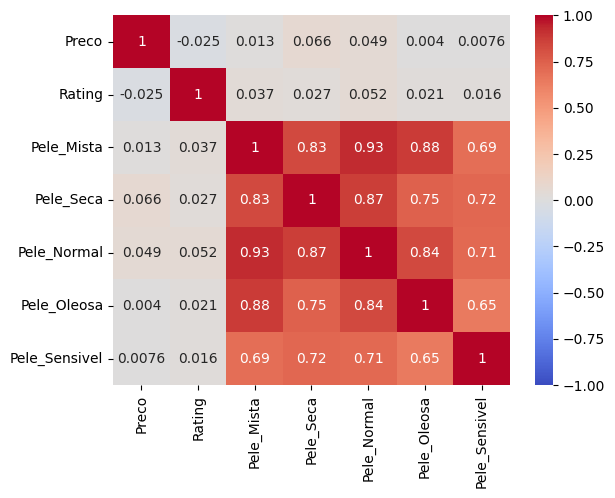

In [42]:
# Plotar matriz de correlação
sns.heatmap(correlation_matrix, annot=True, vmin=-1, vmax=1, cmap='coolwarm')

## Treinamento do algoritmo

In [43]:
# Copiar o dataframe original
X = df_cosmeticos.copy()
X.drop(['Nome', 'Ingredientes'], axis=1, inplace=True)

In [44]:
# Separar as variáveis numéricas e categóricas
numeric_features = ['Rating', 'Preco']
categorical_features = ['Marca', 'Tipo']

In [45]:
# Definir as transformações para cada tipo de variável
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder()

In [48]:
# Criar o pré-processador de colunas
preprocessor = ColumnTransformer(
		transformers=[
			('num', numeric_transformer, numeric_features),
			('cat', categorical_transformer, categorical_features)
	],
  remainder='passthrough',
)

In [49]:
# Aplicar o pré-processamento aos dados
X_transformed = preprocessor.fit_transform(X)

In [50]:
X_transformed

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 10368 stored elements and shape (1472, 129)>

In [51]:
# Armazenar resultados dos t-SNE em um dataframe
df_results = pd.DataFrame()

In [53]:
# Loop de treinamento do t-SNE com diferentes parâmetros perplexity
for perplexity in range(5, 51, 1):
	# Instanciar o t-SNE com o parâmetro perplexity atual
	tsne = TSNE(n_components=2, perplexity=perplexity, init="random", max_iter=250, random_state=51)

	# Treinar o t-SNE com os dados transformados
	tsne_results = tsne.fit_transform(X_transformed)

	# Adicionar os resultados do t-SNE ao dataframe
	temp_df = pd.DataFrame(tsne_results, columns=["Componente 1", "Componente 2"])
	temp_df["Perplexity"] = perplexity
	df_results = pd.concat([df_results, temp_df], axis=0)

In [56]:
df_results.head(10)

,Componente 1,Componente 2,Perplexity
0,-0.698700,-0.465847,5
1,-0.799079,-0.452320,5
2,0.848915,0.055087,5
3,-0.712118,-0.458088,5
4,1.160231,-0.319415,5
5,0.249326,-0.354727,5
6,0.844310,0.040989,5
7,0.845490,0.053807,5
8,1.203498,-0.163963,5
9,-1.353078,0.290612,5


In [55]:
df_results.reset_index(drop=True, inplace=True)

## Análise dos resultados

In [57]:
# Criar um scatterplot animado com variação no perplexity
fig = px.scatter(df_results, x="Componente 1", y="Componente 2", animation_frame="Perplexity", title="Visualização dos dados com t-SNE (variação no perplexity)")
fig.show()